In [ ]:
import dask
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmcrameri as cm
import os
import matplotlib.gridspec as gridspec  
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
dask.config.set(**{'array.slicing.split_large_chunks': True})

In [ ]:
import babet as bb
import atmicp

In [ ]:
atmicp.Constants.palette

[(0.3411764705882353, 0.5647058823529412, 0.9882352941176471),
 (0.9725490196078431, 0.611764705882353, 0.12549019607843137),
 (0.8941176470588236, 0.1450980392156863, 0.21176470588235294),
 (0.5882352941176471, 0.2901960784313726, 0.5450980392156862),
 (0.611764705882353, 0.611764705882353, 0.6313725490196078),
 (0.47843137254901963, 0.12941176470588237, 0.8666666666666667)]

In [ ]:
def diff_with_offset(a, b, dim="inidate", offset=1):
    return a.isel({dim: slice(0, -offset)}) - b.isel({dim: slice(offset, None)})

# Import data

In [ ]:
# ifs025 = atmicp.Data.get_ifs_data(res='US025') # currently don't have all experiments downloaded for this resolution

In [ ]:
ifs100 = atmicp.Data.get_ifs_data(res='GLO100')

Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/pi/GLO100/sfc/cf for b2us*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/pi/GLO100/sfc/pf for b2us*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/pi/GLO100/sfc/cf for b2uu*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/pi/GLO100/sfc/pf for b2uu*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/pi/GLO100/sfc/cf for b2ve*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/pi/GLO100/sfc/pf for b2ve*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/pi/GLO100/sfc/cf for b2vc*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/pi/GLO100/sfc/pf for b2vc*.nc


/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 15
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 15
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 15
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 15
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 15
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/sit

Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/curr/GLO100/sfc/cf for b2ut*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/curr/GLO100/sfc/pf for b2ut*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/incr/GLO100/sfc/cf for b2v0*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/incr/GLO100/sfc/pf for b2v0*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/incr/GLO100/sfc/cf for b2v1*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/incr/GLO100/sfc/pf for b2v1*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/incr/GLO100/sfc/cf for b2vb*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/incr/GLO100/sfc/pf for b2vb*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/MED-R/EXP/incr/GLO100/sfc/cf for b2vd*.nc
Scanning directory /gf5/predict/AWH019_ERMIS_ATMICP/ITERATION/ME

/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 15
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 15
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 15
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 11
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/dask/array/core.py:5200: PerformanceWarning: Increasing number of chunks by factor of 15
  result = blockwise(
/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/sit

# Time series of deltas

In [21]:
# global at 00UTC difference to the previous initidalisation

deltas100 = {}
for climate in ['pi', 'incr']:
    deltas100[climate] = {}
    for pert in ['tq', 'progn_vars', 'tqdvo', 'dvo']:
        tmp1 = ifs100.sel(perturbation=pert, climate=climate)
        tmp2 = ifs100.sel(perturbation='none', climate='curr')
        ifs_diff = diff_with_offset(tmp1, tmp2, dim='inidate', offset=1)

        ifs_diff_delta = []

        for i, ini in enumerate(ifs_diff.inidate.values):
            inidate_data = ifs_diff.sel(inidate=ini)
            timesteps = [ini+np.timedelta64(0,'h')] #[ini+np.timedelta64(0, 'h'), ini+np.timedelta64(24, 'h')]
            ifs_diff_delta.append(inidate_data.sel(time=timesteps).squeeze('time', drop=True))

        ifs_diff_delta = xr.concat(ifs_diff_delta, dim='inidate')
        deltas100[climate][pert] = ifs_diff_delta.mean(dim=['number', 'latitude', 'longitude']).compute()

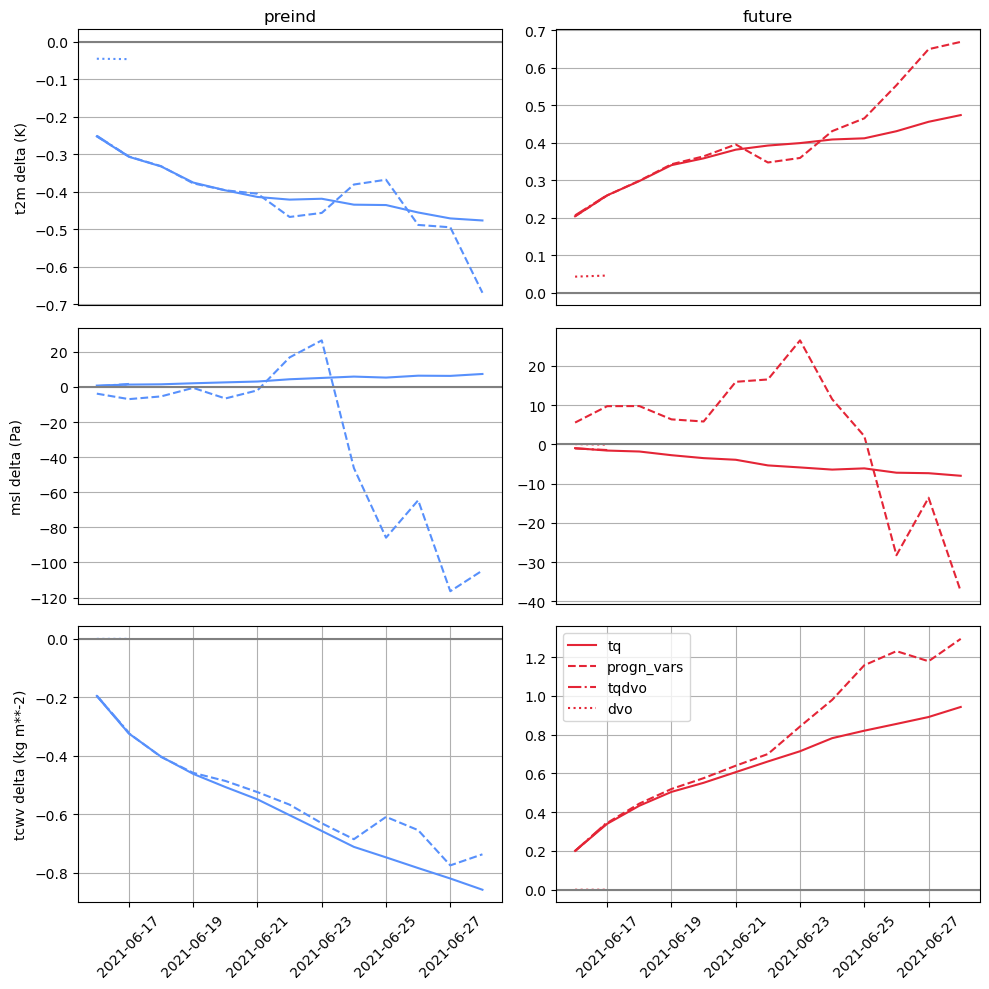

In [23]:
plt.figure(figsize=(10,10))
for v, var in enumerate(['t2m', 'msl', 'tcwv']):
    ax = plt.subplot(3,2,1+v*2)
    ax.plot(deltas100['pi']['tq'].inidate, deltas100['pi']['tq'][var], color=atmicp.Constants.palette[0], linestyle='-')
    ax.plot(deltas100['pi']['progn_vars'].inidate, deltas100['pi']['progn_vars'][var], color=atmicp.Constants.palette[0], linestyle='--')
    ax.plot(deltas100['pi']['tqdvo'].inidate, deltas100['pi']['tqdvo'][var], color=atmicp.Constants.palette[0], linestyle='-.')
    ax.plot(deltas100['pi']['dvo'].inidate, deltas100['pi']['dvo'][var], color=atmicp.Constants.palette[0], linestyle=':')
    plt.ylabel(f'{var} delta ({ifs100[var].units})')
    plt.axhline(0, color='gray', linestyle='-')
    plt.grid()

    if v == 2:
        plt.xticks(rotation=45)
    elif v == 0:
        plt.title('preind')
        ax.set_xticks([])
    elif v == 1:
        ax.set_xticks([])

    ax = plt.subplot(3,2,2+v*2)
    ax.plot(deltas100['incr']['tq'].inidate, deltas100['incr']['tq'][var],  color=atmicp.Constants.palette[2], linestyle='-', label='tq')
    ax.plot(deltas100['incr']['progn_vars'].inidate, deltas100['incr']['progn_vars'][var], color=atmicp.Constants.palette[2], linestyle='--', label='progn_vars')
    ax.plot(deltas100['incr']['tqdvo'].inidate, deltas100['incr']['tqdvo'][var], color=atmicp.Constants.palette[2], linestyle='-.', label='tqdvo')
    ax.plot(deltas100['incr']['dvo'].inidate, deltas100['incr']['dvo'][var], color=atmicp.Constants.palette[2], linestyle=':', label='dvo')
    plt.ylabel('')
    plt.axhline(0, color='gray', linestyle='-')
    plt.grid()

    if v == 2:
        plt.xticks(rotation=45)
        plt.legend(loc='upper left')
    elif v == 0:
        plt.title('future')
        ax.set_xticks([])
    elif v == 1:
        ax.set_xticks([])

plt.tight_layout()
plt.savefig('../figures/02_ifs_global_deltas.png', dpi=600)

In [12]:
# global at 00UTC difference to the previous initidalisation

deltas025 = {}
for climate in ['pi', 'incr']:
    deltas025[climate] = {}
    for pert in ['t+q', 'progn_vars']:
        tmp1 = ifs025.sel(perturbation=pert, climate=climate)
        tmp2 = ifs025.sel(perturbation='none', climate='curr')
        ifs_diff = diff_with_offset(tmp1, tmp2, dim='inidate', offset=1)

        ifs_diff_delta = []

        for i, ini in enumerate(ifs_diff.inidate.values):
            inidate_data = ifs_diff.sel(inidate=ini)
            timesteps = [ini+np.timedelta64(0,'h')] #[ini+np.timedelta64(0, 'h'), ini+np.timedelta64(24, 'h')]
            ifs_diff_delta.append(inidate_data.sel(time=timesteps).squeeze('time', drop=True))

        ifs_diff_delta = xr.concat(ifs_diff_delta, dim='inidate')
        deltas025[climate][pert] = ifs_diff_delta.mean(dim=['number', 'latitude', 'longitude']).compute()

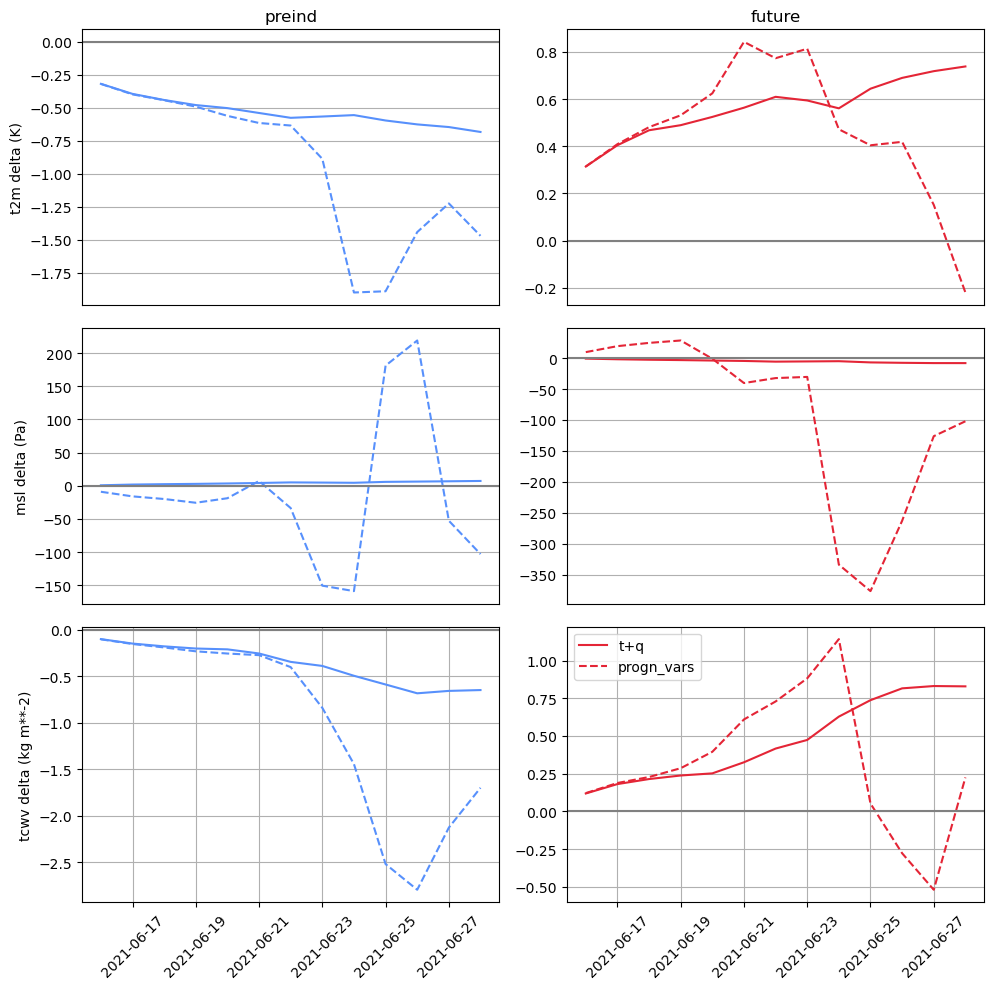

In [ ]:
plt.figure(figsize=(10,10))
for v, var in enumerate(['t2m', 'msl', 'tcwv']):
    ax = plt.subplot(3,2,1+v*2)
    ax.plot(deltas025['pi']['tq'].inidate, deltas025['pi']['tq'][var], color=atmicp.Constants.palette[0], linestyle='-')
    ax.plot(deltas025['pi']['progn_vars'].inidate, deltas025['pi']['progn_vars'][var], color=atmicp.Constants.palette[0], linestyle='--')
    plt.ylabel(f'{var} delta ({ifs100[var].units})')
    plt.axhline(0, color='gray', linestyle='-')
    plt.grid()

    if v == 2:
        plt.xticks(rotation=45)
    elif v == 0:
        plt.title('preind')
        ax.set_xticks([])
    elif v == 1:
        ax.set_xticks([])

    ax = plt.subplot(3,2,2+v*2)
    ax.plot(deltas025['incr']['tq'].inidate, deltas025['incr']['tq'][var],  color=atmicp.Constants.palette[2], linestyle='-', label='tq')
    ax.plot(deltas025['incr']['progn_vars'].inidate, deltas025['incr']['progn_vars'][var], color=atmicp.Constants.palette[2], linestyle='--', label='progn_vars')
    plt.ylabel('')
    plt.axhline(0, color='gray', linestyle='-')
    plt.grid()

    if v == 2:
        plt.xticks(rotation=45)
        plt.legend(loc='upper left')
    elif v == 0:
        plt.title('future')
        ax.set_xticks([])
    elif v == 1:
        ax.set_xticks([])

plt.tight_layout()
plt.savefig('../figures/02_ifs_USwestcoast_deltas.png', dpi=600)

# Timeseries of delta excluding poles

In [9]:
# global at 00UTC difference to the previous initidalisation

# exclude poles
ifs100_noPoles = ifs100.where((ifs100.latitude > -60) & (ifs100.latitude < 60), drop=True)

deltas100_noPoles = {}
for climate in ['pi', 'incr']:
    deltas100_noPoles[climate] = {}
    for pert in ['tq', 'progn_vars', 'tqdvo', 'dvo']:
        tmp1 = ifs100_noPoles.sel(perturbation=pert, climate=climate)
        tmp2 = ifs100_noPoles.sel(perturbation='none', climate='curr')
        ifs_diff = diff_with_offset(tmp1, tmp2, dim='inidate', offset=1)

        ifs_diff_delta = []

        for i, ini in enumerate(ifs_diff.inidate.values):
            inidate_data = ifs_diff.sel(inidate=ini)
            timesteps = [ini+np.timedelta64(0,'h')] #[ini+np.timedelta64(0, 'h'), ini+np.timedelta64(24, 'h')]
            ifs_diff_delta.append(inidate_data.sel(time=timesteps).squeeze('time', drop=True))

        ifs_diff_delta = xr.concat(ifs_diff_delta, dim='inidate')
        deltas100_noPoles[climate][pert] = ifs_diff_delta.mean(dim=['number', 'latitude', 'longitude']).compute()

KeyboardInterrupt: 

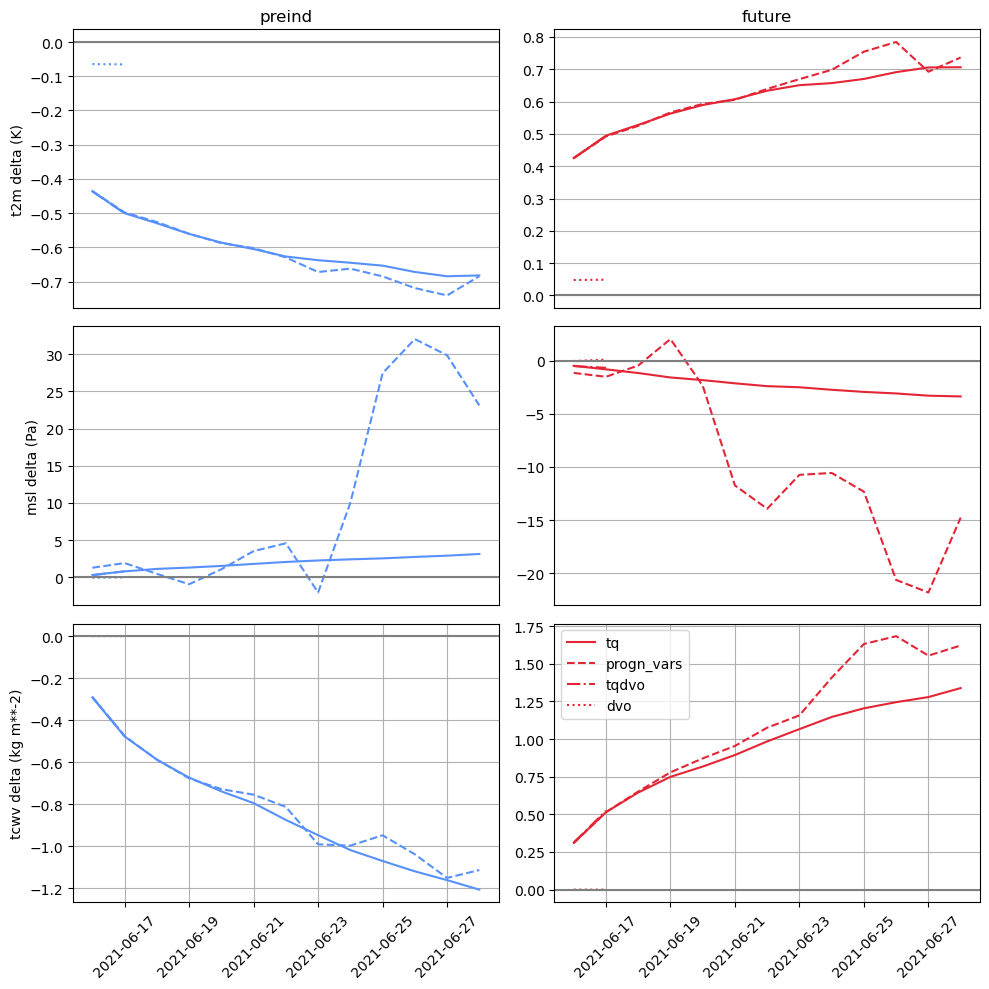

In [15]:
plt.figure(figsize=(10,10))

for v, var in enumerate(['t2m', 'msl', 'tcwv']):
    
    ax = plt.subplot(3,2,1+v*2)
    ax.plot(deltas100_noPoles['pi']['tq'].inidate, deltas100_noPoles['pi']['tq'][var], color=atmicp.Constants.palette[0], linestyle='-')
    ax.plot(deltas100_noPoles['pi']['progn_vars'].inidate, deltas100_noPoles['pi']['progn_vars'][var], color=atmicp.Constants.palette[0], linestyle='--')
    ax.plot(deltas100_noPoles['pi']['tqdvo'].inidate, deltas100_noPoles['pi']['tqdvo'][var], color=atmicp.Constants.palette[0], linestyle='-.')
    ax.plot(deltas100_noPoles['pi']['dvo'].inidate, deltas100_noPoles['pi']['dvo'][var], color=atmicp.Constants.palette[0], linestyle=':')
    plt.ylabel(f'{var} delta ({ifs100[var].units})')
    plt.axhline(0, color='gray', linestyle='-')
    plt.grid()

    if v == 2:
        plt.xticks(rotation=45)
    elif v == 0:
        plt.title('preind')
        ax.set_xticks([])
    elif v == 1:
        ax.set_xticks([])

    ax = plt.subplot(3,2,2+v*2)
    ax.plot(deltas100_noPoles['incr']['tq'].inidate, deltas100_noPoles['incr']['tq'][var],  color=atmicp.Constants.palette[2], linestyle='-', label='tq')
    ax.plot(deltas100_noPoles['incr']['progn_vars'].inidate, deltas100_noPoles['incr']['progn_vars'][var], color=atmicp.Constants.palette[2], linestyle='--', label='progn_vars')
    ax.plot(deltas100_noPoles['incr']['tqdvo'].inidate, deltas100_noPoles['incr']['tqdvo'][var], color=atmicp.Constants.palette[2], linestyle='-.', label='tqdvo')
    ax.plot(deltas100_noPoles['incr']['dvo'].inidate, deltas100_noPoles['incr']['dvo'][var], color=atmicp.Constants.palette[2], linestyle=':', label='dvo')
    plt.ylabel('')
    plt.axhline(0, color='gray', linestyle='-')
    plt.grid()

    if v == 2:
        plt.xticks(rotation=45)
        plt.legend(loc='upper left')
    elif v == 0:
        plt.title('future')
        ax.set_xticks([])
    elif v == 1:
        ax.set_xticks([])

plt.tight_layout()
plt.savefig('../figures/02_ifs_global_deltas_noPoles.png', dpi=600)

# Maps of surface deltas

In [8]:
# global at 00UTC difference to the previous initidalisation

delta_maps100 = {}
for climate in ['pi', 'incr']:
    delta_maps100[climate] = {}
    for pert in ['tq', 'progn_vars', 'tqdvo', 'dvo']:
        tmp1 = ifs100.sel(perturbation=pert, climate=climate)
        tmp2 = ifs100.sel(perturbation='none', climate='curr')
        ifs_diff = diff_with_offset(tmp1, tmp2, dim='inidate', offset=1)

        ifs_diff_delta = []

        for i, ini in enumerate(ifs_diff.inidate.values):
            inidate_data = ifs_diff.sel(inidate=ini)
            timesteps = [ini+np.timedelta64(0,'h')] #[ini+np.timedelta64(0, 'h'), ini+np.timedelta64(24, 'h')]
            ifs_diff_delta.append(inidate_data.sel(time=timesteps).squeeze('time', drop=True))

        ifs_diff_delta = xr.concat(ifs_diff_delta, dim='inidate')
        delta_maps100[climate][pert] = ifs_diff_delta.mean(dim=['number']).compute()

KeyboardInterrupt: 

/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/xarray/plot/dataarray_plot.py:2145: UserWarning: The following kwargs were not used by contour: 'title'
  primitive = ax.contourf(x, y, z, **kwargs)


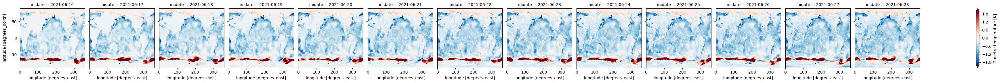

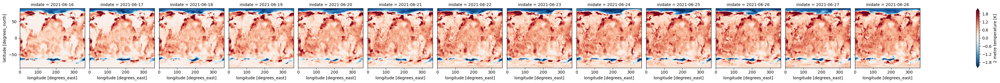

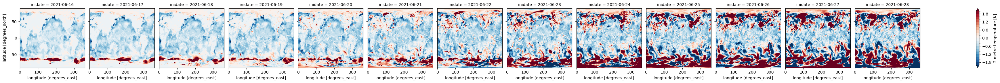

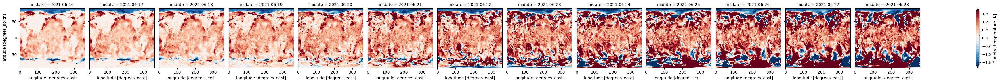

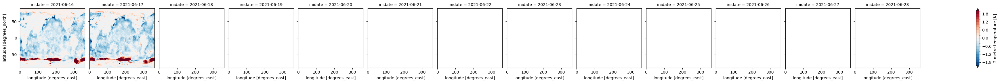

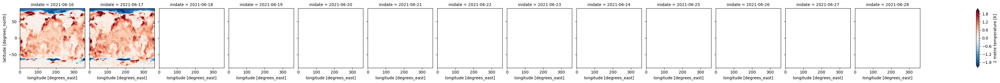

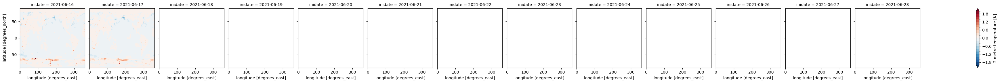

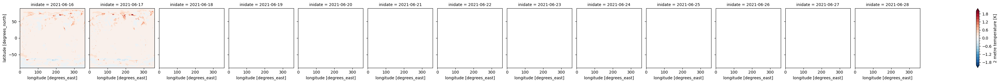

In [17]:
v = 2
delta_maps100['pi']['tq'].t2m.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, tq')
delta_maps100['incr']['tq'].t2m.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, tq')

delta_maps100['pi']['progn_vars'].t2m.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, progn_vars')
delta_maps100['incr']['progn_vars'].t2m.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, progn_vars')

delta_maps100['pi']['tqdvo'].t2m.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, tqdvo')
delta_maps100['incr']['tqdvo'].t2m.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, tqdvo')

delta_maps100['pi']['dvo'].t2m.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, dvo')
delta_maps100['incr']['dvo'].t2m.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, dvo')

/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/xarray/plot/dataarray_plot.py:2145: UserWarning: The following kwargs were not used by contour: 'title'
  primitive = ax.contourf(x, y, z, **kwargs)


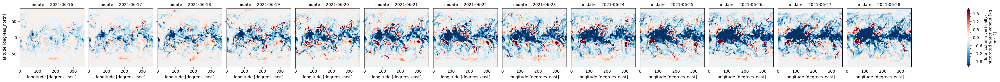

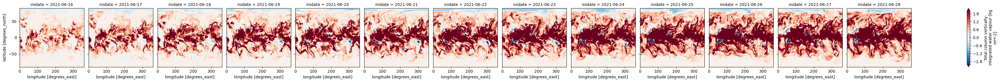

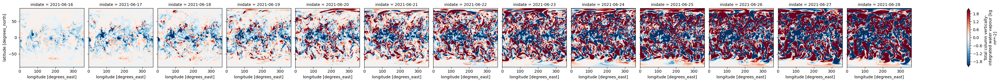

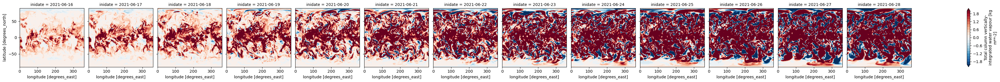

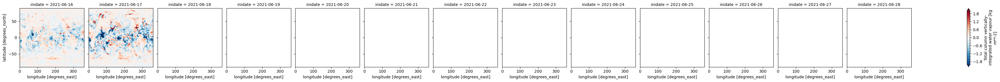

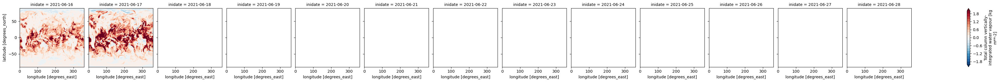

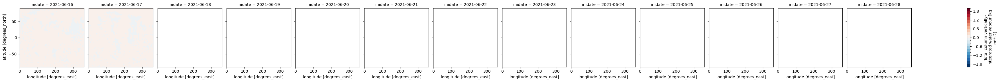

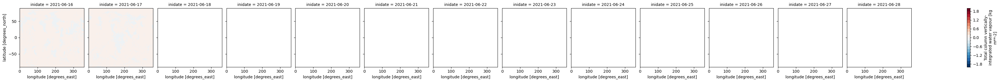

In [19]:
v = 2
delta_maps100['pi']['tq'].tcwv.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, tq')
delta_maps100['incr']['tq'].tcwv.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, tq')

delta_maps100['pi']['progn_vars'].tcwv.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, progn_vars')
delta_maps100['incr']['progn_vars'].tcwv.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, progn_vars')

delta_maps100['pi']['tqdvo'].tcwv.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, tqdvo')
delta_maps100['incr']['tqdvo'].tcwv.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, tqdvo')

delta_maps100['pi']['dvo'].tcwv.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, dvo')
delta_maps100['incr']['dvo'].tcwv.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, dvo')

/home/e/ermis/nobackups/miniforge3/envs/atmicp/lib/python3.13/site-packages/xarray/plot/dataarray_plot.py:2145: UserWarning: The following kwargs were not used by contour: 'title'
  primitive = ax.contourf(x, y, z, **kwargs)


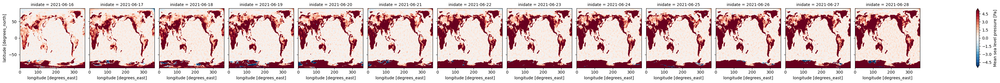

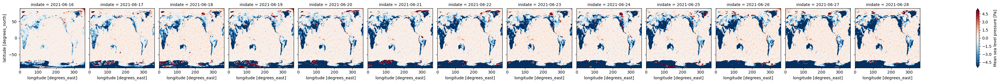

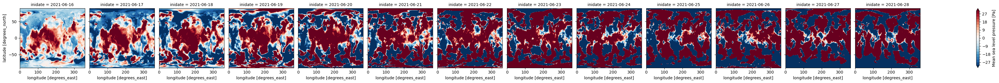

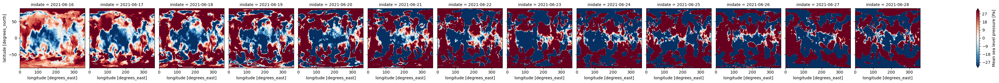

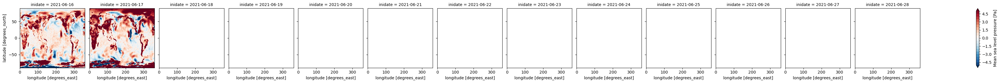

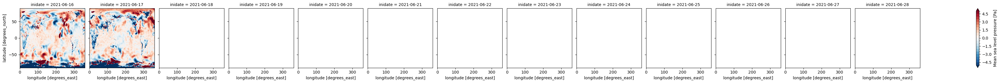

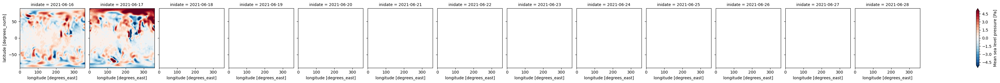

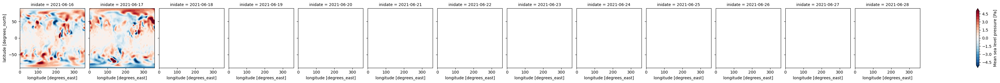

In [ ]:
v = 5
delta_maps100['pi']['tq'].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, tq')
delta_maps100['incr']['tq'].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, tq')

v = 30 # CAREFUL cmap limits are changing!
delta_maps100['pi']['progn_vars'].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, progn_vars')
delta_maps100['incr']['progn_vars'].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, progn_vars')

v = 5
delta_maps100['pi']['tqdvo'].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, tqdvo')
delta_maps100['incr']['tqdvo'].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, tqdvo')

delta_maps100['pi']['dvo'].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='pi, dvo')
delta_maps100['incr']['dvo'].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21, title='incr, dvo')

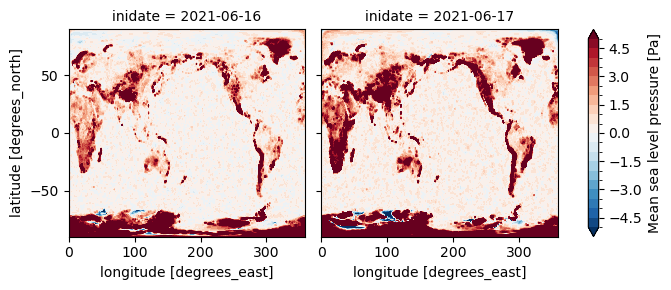

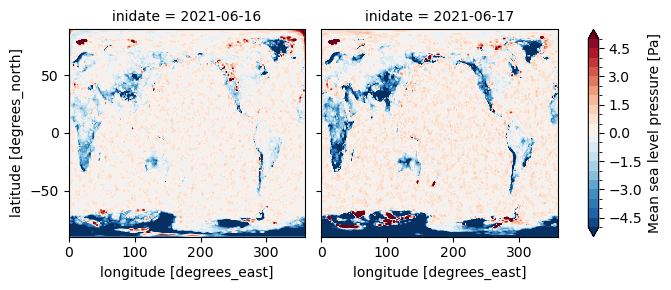

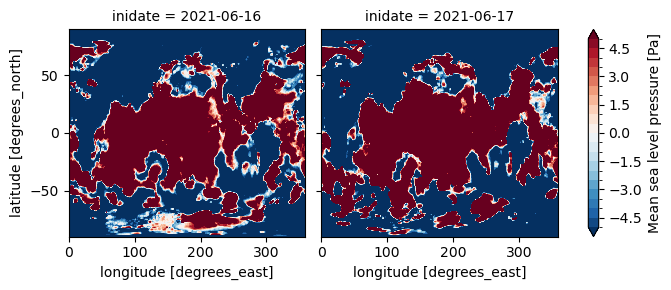

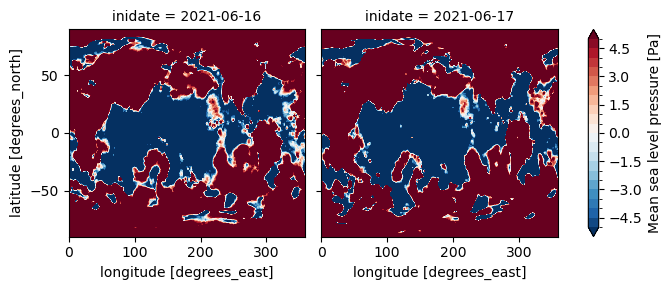

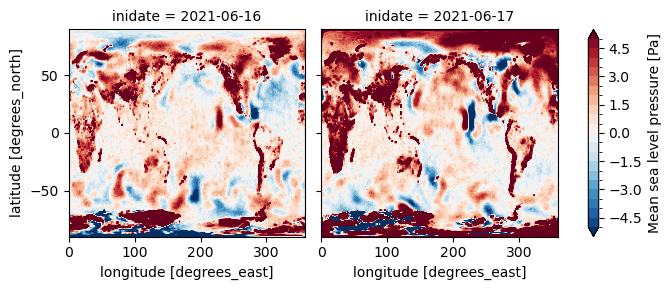

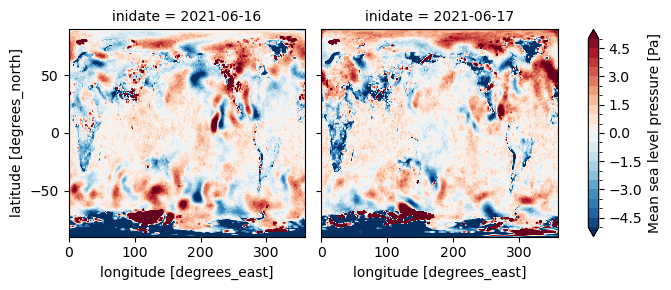

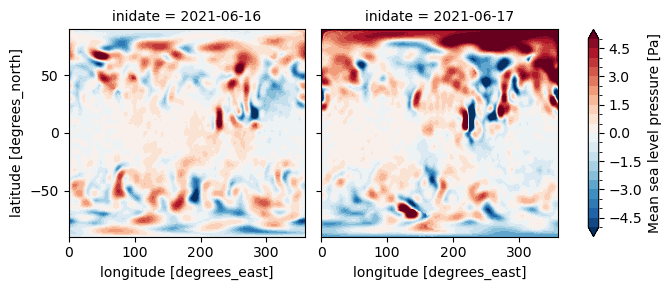

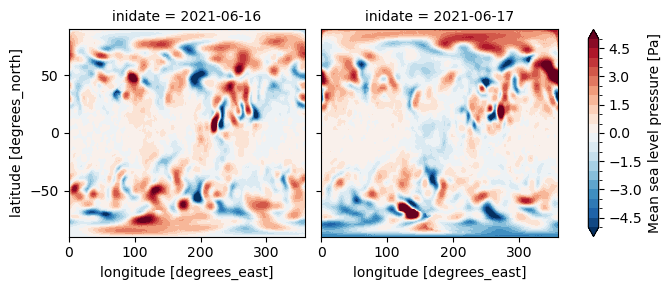

In [33]:
v = 5

delta_maps100_tests = {outer_key: {inner_key: delta_maps100[outer_key][inner_key].sel(inidate=slice('2021-06-15', '2021-06-17')) for inner_key in delta_maps100[outer_key].keys()} for outer_key in delta_maps100.keys()}

for test in ['tq', 'progn_vars', 'tqdvo', 'dvo']:
    delta_maps100_tests['pi'][test].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21)
    delta_maps100_tests['incr'][test].msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21)

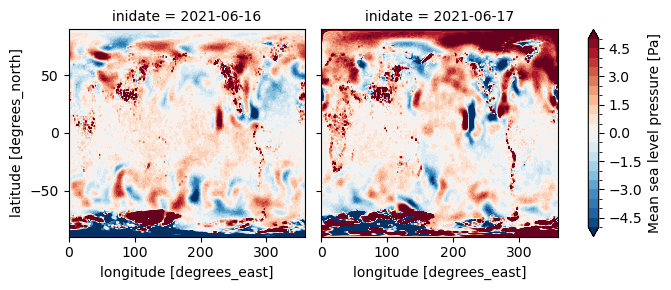

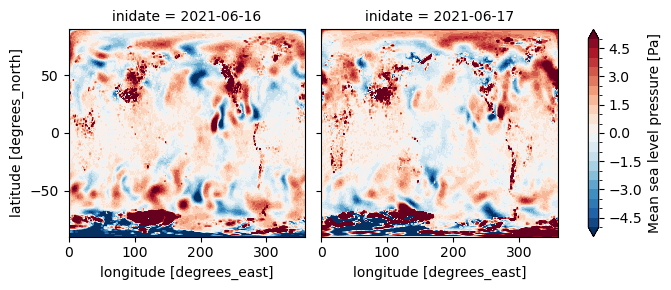

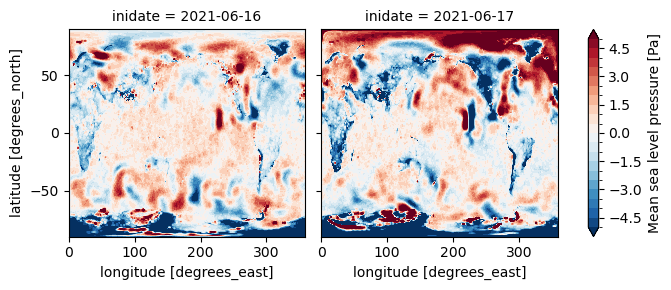

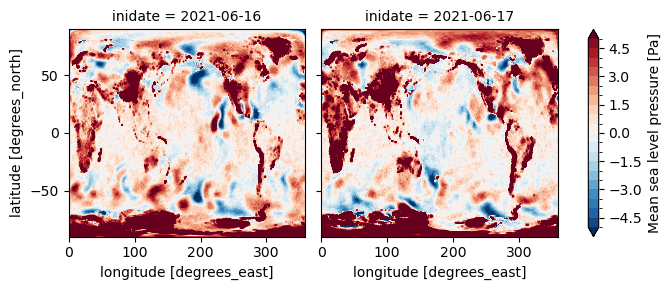

In [32]:
v = 5

delta_maps100_tests = {outer_key: {inner_key: delta_maps100[outer_key][inner_key].sel(inidate=slice('2021-06-15', '2021-06-17')) for inner_key in delta_maps100[outer_key].keys()} for outer_key in delta_maps100.keys()}

for test in ['tqdvo', 'dvo']:
    (delta_maps100_tests['pi'][test] - delta_maps100_tests['pi']['tq']).msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21)
    (delta_maps100_tests['incr'][test] - delta_maps100_tests['incr']['tq']).msl.plot.contourf(col='inidate', vmin=-1*v, vmax=v, cmap='RdBu_r', levels=21)

# Deltas with masked poles and land

In [29]:
# exclude poles 
ifs100_noPoles = ifs100.where((ifs100.latitude > -60) & (ifs100.latitude < 60), drop=True)

# apply land-sea mask
lsm = atmicp.Data.get_lsm(res='GLO100')
ifs100_noPoles_noland = ifs100_noPoles.where(lsm<0.5) # lsm is not binary but gives fraction of land 

deltas100_noPoles_noland = {}
for climate in ['pi', 'incr']:
    deltas100_noPoles_noland[climate] = {}
    for pert in ['tq', 'progn_vars', 'tqdvo', 'dvo']:
        tmp1 = ifs100_noPoles_noland.sel(perturbation=pert, climate=climate)
        tmp2 = ifs100_noPoles_noland.sel(perturbation='none', climate='curr')
        ifs_diff = diff_with_offset(tmp1, tmp2, dim='inidate', offset=1)

        ifs_diff_delta = []

        for i, ini in enumerate(ifs_diff.inidate.values):
            inidate_data = ifs_diff.sel(inidate=ini)
            timesteps = [ini+np.timedelta64(0,'h')] #[ini+np.timedelta64(0, 'h'), ini+np.timedelta64(24, 'h')]
            ifs_diff_delta.append(inidate_data.sel(time=timesteps).squeeze('time', drop=True))

        ifs_diff_delta = xr.concat(ifs_diff_delta, dim='inidate')
        deltas100_noPoles_noland[climate][pert] = ifs_diff_delta.mean(dim=['number', 'latitude', 'longitude']).compute()

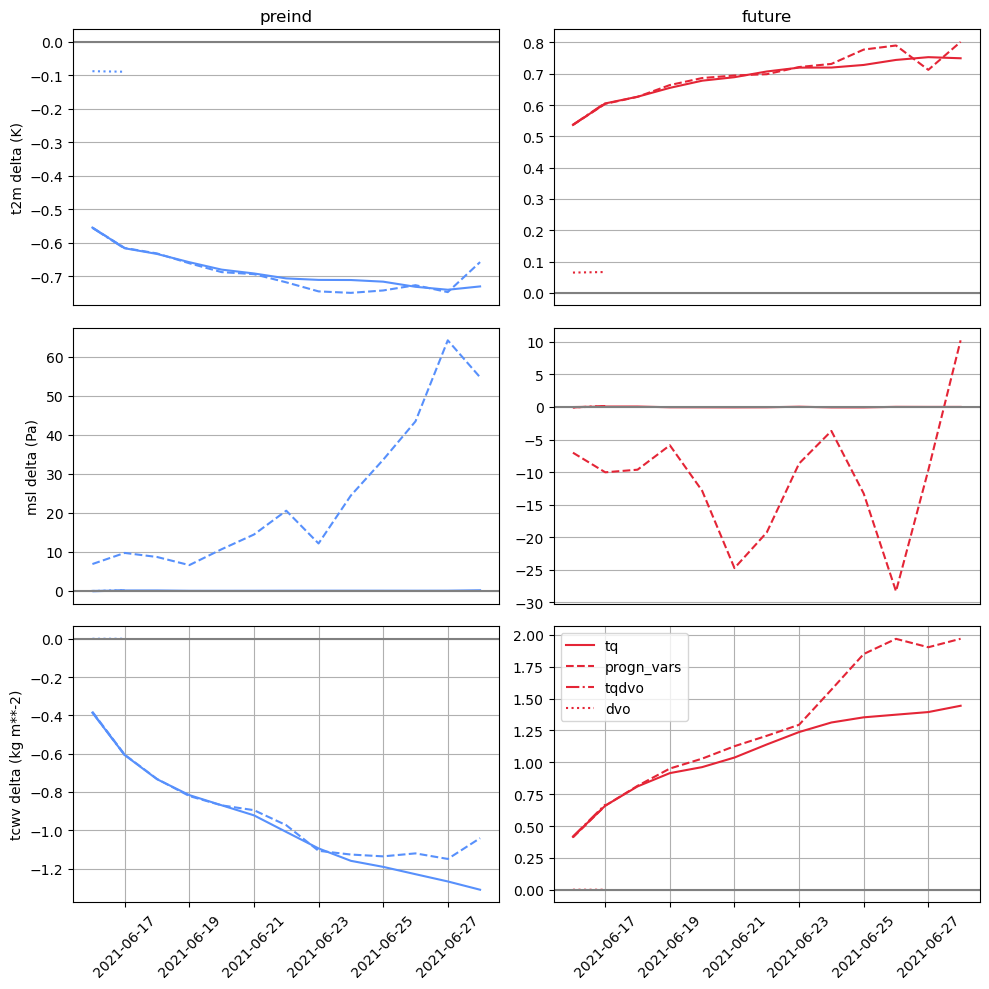

In [30]:
plt.figure(figsize=(10,10))

for v, var in enumerate(['t2m', 'msl', 'tcwv']):
    
    ax = plt.subplot(3,2,1+v*2)
    ax.plot(deltas100_noPoles_noland['pi']['tq'].inidate, deltas100_noPoles_noland['pi']['tq'][var], color=atmicp.Constants.palette[0], linestyle='-')
    ax.plot(deltas100_noPoles_noland['pi']['progn_vars'].inidate, deltas100_noPoles_noland['pi']['progn_vars'][var], color=atmicp.Constants.palette[0], linestyle='--')
    ax.plot(deltas100_noPoles_noland['pi']['tqdvo'].inidate, deltas100_noPoles_noland['pi']['tqdvo'][var], color=atmicp.Constants.palette[0], linestyle='-.')
    ax.plot(deltas100_noPoles_noland['pi']['dvo'].inidate, deltas100_noPoles_noland['pi']['dvo'][var], color=atmicp.Constants.palette[0], linestyle=':')
    plt.ylabel(f'{var} delta ({ifs100[var].units})')
    plt.axhline(0, color='gray', linestyle='-')
    plt.grid()

    if v == 2:
        plt.xticks(rotation=45)
    elif v == 0:
        plt.title('preind')
        ax.set_xticks([])
    elif v == 1:
        ax.set_xticks([])

    ax = plt.subplot(3,2,2+v*2)
    ax.plot(deltas100_noPoles_noland['incr']['tq'].inidate, deltas100_noPoles_noland['incr']['tq'][var],  color=atmicp.Constants.palette[2], linestyle='-', label='tq')
    ax.plot(deltas100_noPoles_noland['incr']['progn_vars'].inidate, deltas100_noPoles_noland['incr']['progn_vars'][var], color=atmicp.Constants.palette[2], linestyle='--', label='progn_vars')
    ax.plot(deltas100_noPoles_noland['incr']['tqdvo'].inidate, deltas100_noPoles_noland['incr']['tqdvo'][var], color=atmicp.Constants.palette[2], linestyle='-.', label='tqdvo')
    ax.plot(deltas100_noPoles_noland['incr']['dvo'].inidate, deltas100_noPoles_noland['incr']['dvo'][var], color=atmicp.Constants.palette[2], linestyle=':', label='dvo')
    plt.ylabel('')
    plt.axhline(0, color='gray', linestyle='-')
    plt.grid()

    if v == 2:
        plt.xticks(rotation=45)
        plt.legend(loc='upper left')
    elif v == 0:
        plt.title('future')
        ax.set_xticks([])
    elif v == 1:
        ax.set_xticks([])

plt.tight_layout()
plt.savefig('../figures/02_ifs_global_deltas_noPoles.png', dpi=600)